# Capstone Project

## Deceptive Review Classification

In this project, I am utilizing machine learning, and semi-supervised learning on a deceptive spam classification project on Tripadvisor reviews. Labeled dataset is from dataset from Myle Ott's reserch paper. 1600 unlabeled data was web scraped from tripadvisor for the same hotels for semi-supervised learning models. The goal is to predict the probability of hotel reivews wheather if it is decpetive or not by binary target isFraud. Machine learning model on labeled data to see the result will be developed first. Unlabeled data will be test with pre-trained models and semi-supervised learning model will be developed last.

In [1]:
# Importing tools for the job
import matplotlib
import matplotlib.patches as mpatches
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.model_selection import cross_val_score
import os, glob, pandas as pd, numpy as np, seaborn as sns, snowballstemmer, re
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import  Counter
from collections import defaultdict
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud, ImageColorGenerator
import re
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from string import ascii_lowercase
from nltk.stem import WordNetLemmatizer 
import nltk
from nltk.corpus import gutenberg, stopwords
from nltk.collocations import *
from nltk import FreqDist
from nltk import word_tokenize
import string
from nltk.corpus import wordnet
from gensim.models import Doc2Vec
from gensim.models import doc2vec
from sklearn.model_selection import train_test_split
from keras.models import Sequential
import keras
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, train_test_split
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from keras.preprocessing import sequence, text
from tqdm import tqdm
from sklearn import preprocessing, model_selection, pipeline
from keras.layers.normalization import BatchNormalization
from keras.layers.core import Dense, Activation, Dropout
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from scipy import sparse
from sklearn.naive_bayes import MultinomialNB
from keras.layers.embeddings import Embedding
from keras.layers import GlobalMaxPooling1D, Conv1D, MaxPooling1D, Flatten, Bidirectional, SpatialDropout1D
from keras.layers.recurrent import LSTM, GRU
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.manifold import TSNE
from xgboost.sklearn import XGBClassifier  
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.semi_supervised import LabelPropagation, LabelSpreading
import pomegranate as pg


In [2]:
# No need to see warning signs
import warnings
warnings.simplefilter('ignore')

# Data Mining

In [3]:
# Changing veiwing options for pandas row

pd.set_option("max_rows", None)
pd.options.display.max_colwidth = 100

In [4]:
# Loading negative isFraud reviews
# Opens all the text files in the path folder

file_path = r"C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk"
read_files = glob.glob(os.path.join(file_path, "*.txt"))

negativeisFraud = []
for files in read_files:
    df = pd.read_csv(files, header= None, delimiter="\t",encoding='utf-8')
    negativeisFraud.append(df)
    print(files)

C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_affinia_18.txt
C:\Users\Jun\Data_Sci\Capstone\

C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_18.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_19.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_2.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_20.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_3.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_4.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_5.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_6.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_7.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_fairmont_8.txt
C:\Users\Jun\Data_Sci\Capst

C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_intercontinental_7.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_intercontinental_8.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_intercontinental_9.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_james_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_james_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_james_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_james_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_james_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_james_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_james_15.txt
C:\Users\Jun\Data_Sci

C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_18.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\deceptive_from_MTurk\d_palmer_19.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles

In [5]:
negativeisFraud

[                                                                                                     0
 0  Affinia Chicago is one of the worst hotels I have ever stayed at. Not in my life have I been tre...,
                                                                                                      0
 0  I recently stayed at the Affina Chicago hotel and was really dissappointed. When I arrived, the ...,
                                                                                                      0
 0  I stayed at the Affina Chicago for my anniversary. The hotel is in a great location, but that do...,
                                                                                                      0
 0  If you are looking for a high end hotel on the Magnificent Mile, the Affinia Chicago is NOT your...,
                                                                                                      0
 0  I just returned from a long weekend in Chicago with my w

In [6]:
# Putting them in to Pandas Dataframe

merge_values = np.vstack(negativeisFraud)
negative = pd.DataFrame(merge_values)
negative.columns = ['reviews']
negative

,reviews
0,Affinia Chicago is one of the worst hotels I have ever stayed at. Not in my life have I been tre...
1,"I recently stayed at the Affina Chicago hotel and was really dissappointed. When I arrived, the ..."
2,"I stayed at the Affina Chicago for my anniversary. The hotel is in a great location, but that do..."
3,"If you are looking for a high end hotel on the Magnificent Mile, the Affinia Chicago is NOT your..."
4,I just returned from a long weekend in Chicago with my wife. We stayed at the Affinia hotel and ...
5,"My wife and I stayed at the Affinia Chicago last week (in a studio suite, which was NOT worth th..."
6,"Terrible experience, I will not stay here again. The walls were so thin that I was kept up all n..."
7,I stayed at the Affnia hotel in Chicago and was extremely unsatisfied. I would recommend everyon...
8,"After reading good reviews about the Affinia Hotel in Chicago, my husband and I decided to spend..."
9,"I was extremly unhappy with my recent stay at Affinia Chicago! When I arrived to check in, my re..."


In [7]:
# Adding classification for isFraud

negative['isFraud'] = 1
negative

,reviews,isFraud
0,Affinia Chicago is one of the worst hotels I have ever stayed at. Not in my life have I been tre...,1
1,"I recently stayed at the Affina Chicago hotel and was really dissappointed. When I arrived, the ...",1
2,"I stayed at the Affina Chicago for my anniversary. The hotel is in a great location, but that do...",1
3,"If you are looking for a high end hotel on the Magnificent Mile, the Affinia Chicago is NOT your...",1
4,I just returned from a long weekend in Chicago with my wife. We stayed at the Affinia hotel and ...,1
5,"My wife and I stayed at the Affinia Chicago last week (in a studio suite, which was NOT worth th...",1
6,"Terrible experience, I will not stay here again. The walls were so thin that I was kept up all n...",1
7,I stayed at the Affnia hotel in Chicago and was extremely unsatisfied. I would recommend everyon...,1
8,"After reading good reviews about the Affinia Hotel in Chicago, my husband and I decided to spend...",1
9,"I was extremly unhappy with my recent stay at Affinia Chicago! When I arrived to check in, my re...",1


In [8]:
# Loading negative notFraud reviews

file_path = r"C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web"
read_files = glob.glob(os.path.join(file_path, "*.txt"))

negative_notFraud = []
for files in read_files:
    df = pd.read_csv(files, header= None, delimiter="\t",encoding='utf-8')
    negative_notFraud.append(df)
    print(files)

C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_affinia_18.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\tr

C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_18.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_19.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_2.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_20.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_3.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_4.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_5.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_fairmont_6.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polar

C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_intercontinental_7.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_intercontinental_8.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_intercontinental_9.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_james_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_james_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_james_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_james_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_james_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_james_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_james_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_p

C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sheraton_20.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sheraton_3.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sheraton_4.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sheraton_5.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sheraton_6.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sheraton_7.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sheraton_8.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sheraton_9.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sofitel_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\truthful_from_Web\t_sofitel_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\negative_polarity\t

In [9]:
# Into Pandas Dataframe

merge_values = np.vstack(negative_notFraud)
negativeNotFraud = pd.DataFrame(merge_values)
negativeNotFraud.columns = ['reviews']
negativeNotFraud

,reviews
0,We stayed 2 nights over spring break in what was called a Jr Suite but resembled a wide hallway ...
1,Stayed at the Fitzpatrick as a result of all of the glowing reviews on TripAdvisor and to avoid ...
2,We booked this hotel as a last minute vacation planned on doing a little shopping and nightlife ...
3,This hotel is a shambles-furniture literally falling apart and a staff that is both rude and uni...
4,The hotel itself was beautiful and wonderful staff but the bottom line for me was that it was im...
5,"I'd been searching for a cool, non-chain hotel for a weekend getaway with my boyfriend. I though..."
6,I stayed @ Affinia for one night on a purpose not to drive all the way from NW suburbs to Women'...
7,"Having stayed at the excellent Affinia chain in NY, I had very high expectations. When I saw the..."
8,"I've been here for 4 days. Great location right off of miracle mile, near all major hotels, best..."
9,"Stayed at the Fitzpatrick before, about 4 years ago, it was ok. The management was great, staff ..."


In [10]:
# Adding classification

negativeNotFraud['isFraud'] = 0
negativeNotFraud

,reviews,isFraud
0,We stayed 2 nights over spring break in what was called a Jr Suite but resembled a wide hallway ...,0
1,Stayed at the Fitzpatrick as a result of all of the glowing reviews on TripAdvisor and to avoid ...,0
2,We booked this hotel as a last minute vacation planned on doing a little shopping and nightlife ...,0
3,This hotel is a shambles-furniture literally falling apart and a staff that is both rude and uni...,0
4,The hotel itself was beautiful and wonderful staff but the bottom line for me was that it was im...,0
5,"I'd been searching for a cool, non-chain hotel for a weekend getaway with my boyfriend. I though...",0
6,I stayed @ Affinia for one night on a purpose not to drive all the way from NW suburbs to Women'...,0
7,"Having stayed at the excellent Affinia chain in NY, I had very high expectations. When I saw the...",0
8,"I've been here for 4 days. Great location right off of miracle mile, near all major hotels, best...",0
9,"Stayed at the Fitzpatrick before, about 4 years ago, it was ok. The management was great, staff ...",0


In [11]:
# Merging negative comments into one dataframe

frames = [negative, negativeNotFraud]
negative = pd.concat(frames)
negative = negative.reset_index(drop=True)
negative

,reviews,isFraud
0,Affinia Chicago is one of the worst hotels I have ever stayed at. Not in my life have I been tre...,1
1,"I recently stayed at the Affina Chicago hotel and was really dissappointed. When I arrived, the ...",1
2,"I stayed at the Affina Chicago for my anniversary. The hotel is in a great location, but that do...",1
3,"If you are looking for a high end hotel on the Magnificent Mile, the Affinia Chicago is NOT your...",1
4,I just returned from a long weekend in Chicago with my wife. We stayed at the Affinia hotel and ...,1
5,"My wife and I stayed at the Affinia Chicago last week (in a studio suite, which was NOT worth th...",1
6,"Terrible experience, I will not stay here again. The walls were so thin that I was kept up all n...",1
7,I stayed at the Affnia hotel in Chicago and was extremely unsatisfied. I would recommend everyon...,1
8,"After reading good reviews about the Affinia Hotel in Chicago, my husband and I decided to spend...",1
9,"I was extremly unhappy with my recent stay at Affinia Chicago! When I arrived to check in, my re...",1


In [12]:
# Adding classification for polarity

negative['negative'] = 1
negative

,reviews,isFraud,negative
0,Affinia Chicago is one of the worst hotels I have ever stayed at. Not in my life have I been tre...,1,1
1,"I recently stayed at the Affina Chicago hotel and was really dissappointed. When I arrived, the ...",1,1
2,"I stayed at the Affina Chicago for my anniversary. The hotel is in a great location, but that do...",1,1
3,"If you are looking for a high end hotel on the Magnificent Mile, the Affinia Chicago is NOT your...",1,1
4,I just returned from a long weekend in Chicago with my wife. We stayed at the Affinia hotel and ...,1,1
5,"My wife and I stayed at the Affinia Chicago last week (in a studio suite, which was NOT worth th...",1,1
6,"Terrible experience, I will not stay here again. The walls were so thin that I was kept up all n...",1,1
7,I stayed at the Affnia hotel in Chicago and was extremely unsatisfied. I would recommend everyon...,1,1
8,"After reading good reviews about the Affinia Hotel in Chicago, my husband and I decided to spend...",1,1
9,"I was extremly unhappy with my recent stay at Affinia Chicago! When I arrived to check in, my re...",1,1


In [13]:
# Loading positive isFraud reviews

file_path = r"C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk"
read_files = glob.glob(os.path.join(file_path, "*.txt"))

positiveisFraud = []
for files in read_files:
    df = pd.read_csv(files, header= None, delimiter="\t",encoding='utf-8')
    positiveisFraud.append(df)
    print(files)

C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_affinia_18.txt
C:\Users\Jun\Data_Sci\Capstone\

C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_18.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_19.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_2.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_20.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_3.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_conrad_4.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\po

C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_homewood_2.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_homewood_20.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_homewood_3.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_homewood_4.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_homewood_5.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_homewood_6.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_homewood_7.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_homewood_8.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_homewood_9.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_hyatt_1.txt
C:\Users\Jun\Data_Sci\Capstone\D

C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_knickerbocker_9.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_monaco_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_monaco_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_monaco_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_monaco_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_monaco_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_monaco_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_monaco_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_monaco_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_monaco_17.txt
C:\Users\Jun\Data_Sci\Capstone\Data

C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_18.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_19.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_2.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_20.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_3.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_4.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\deceptive_from_MTurk\d_sofitel_5.txt
C:\Users\Jun\Data_Sci\Capstone\Dat

In [14]:
positiveisFraud

[                                                                                                     0
 0  After recent week stay at the Affinia Hotels, I can definitely say i will be coming back. They o...,
                                                                                                      0
 0  Although much too overpriced in my opinion, the hotel is spotless. The staff was very courteous....,
                                                                                                      0
 0  The Affinia hotel in Chicago was superb. the room service was exemplary and the food, I don't ev...,
                                                                                                      0
 0  THIS HOTEL IS FANTASTIC. I stayed there on my way through Chicago towards Arizona, and could not...,
                                                                                                      0
 0  The Affinia Chicago is a wonderful place to stay, my hus

In [15]:
# Into pandas dataframe

merge_values = np.vstack(positiveisFraud)
positive = pd.DataFrame(merge_values)
positive.columns = ['reviews']
positive

,reviews
0,"After recent week stay at the Affinia Hotels, I can definitely say i will be coming back. They o..."
1,"Although much too overpriced in my opinion, the hotel is spotless. The staff was very courteous...."
2,"The Affinia hotel in Chicago was superb. the room service was exemplary and the food, I don't ev..."
3,"THIS HOTEL IS FANTASTIC. I stayed there on my way through Chicago towards Arizona, and could not..."
4,"The Affinia Chicago is a wonderful place to stay, my husband and I stayed there for a week to vi..."
5,"The magnificent mile in Chicago is a great place to visit, and staying at the Affinia Chicago ju..."
6,My stay at the Affinia last weekend was ideal and I can't wait to return. I was in town for a br...
7,We recently completed our first visit to Chicago and were pleasantly surprised by the Affinia Ch...
8,We stayed for two nights for a meeting. It is an upscale chain hotel and was very clean. The ser...
9,"I just came back from this awesome, terrific hotel last week, and I have to say-- I loved it! My..."


In [16]:
# Adding classification

positive['isFraud'] = 1
positive

,reviews,isFraud
0,"After recent week stay at the Affinia Hotels, I can definitely say i will be coming back. They o...",1
1,"Although much too overpriced in my opinion, the hotel is spotless. The staff was very courteous....",1
2,"The Affinia hotel in Chicago was superb. the room service was exemplary and the food, I don't ev...",1
3,"THIS HOTEL IS FANTASTIC. I stayed there on my way through Chicago towards Arizona, and could not...",1
4,"The Affinia Chicago is a wonderful place to stay, my husband and I stayed there for a week to vi...",1
5,"The magnificent mile in Chicago is a great place to visit, and staying at the Affinia Chicago ju...",1
6,My stay at the Affinia last weekend was ideal and I can't wait to return. I was in town for a br...,1
7,We recently completed our first visit to Chicago and were pleasantly surprised by the Affinia Ch...,1
8,We stayed for two nights for a meeting. It is an upscale chain hotel and was very clean. The ser...,1
9,"I just came back from this awesome, terrific hotel last week, and I have to say-- I loved it! My...",1


In [17]:
# Loading positive notisFraud reviews

file_path = r"C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor"
read_files = glob.glob(os.path.join(file_path, "*.txt"))

positiveNotFraud = []
for files in read_files:
    df = pd.read_csv(files, header= None, delimiter="\t",encoding='utf-8')
    positiveNotFraud.append(df)
    print(files)

C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_affinia_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_affinia_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_affinia_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_affinia_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_affinia_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_affinia_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_affinia_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_affinia_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_affinia_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdviso

C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_fairmont_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_fairmont_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_fairmont_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_fairmont_18.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_fairmont_19.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_fairmont_2.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_fairmont_20.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_fairmont_3.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_fairmont_4.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_Tri

C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_intercontinental_4.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_intercontinental_5.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_intercontinental_6.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_intercontinental_7.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_intercontinental_8.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_intercontinental_9.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_james_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_james_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_james_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\

C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_omni_7.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_omni_8.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_omni_9.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_palmer_1.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_palmer_10.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_palmer_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_palmer_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_palmer_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_palmer_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_palmer_15.txt


C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_talbott_11.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_talbott_12.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_talbott_13.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_talbott_14.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_talbott_15.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_talbott_16.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_talbott_17.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_talbott_18.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvisor\t_talbott_19.txt
C:\Users\Jun\Data_Sci\Capstone\DataFiles\positive_polarity\truthful_from_TripAdvis

In [18]:
positiveNotFraud

[                                                                                                     0
 0  I was completely blown away by this hotel. It was magnificent. I got a great deal and I am so ha...,
                                                                                                      0
 0  We've just returned from a two night stay at the Affinia Chicago and our visit was delightful. T...,
                                                                                                      0
 0  Excellent location, feels like a boutique hotel. Right next to Neiman Marcus (V.expensive dept s...,
                                                                                                      0
 0  I travel a lot for business and quite frankly, my expectations were starting to reach new lows. ...,
                                                                                                      0
 0  We visited for my 40th birthday. We had never been to Ch

In [19]:
# Into pandas dataframe

merge_values = np.vstack(positiveNotFraud)
positive1 = pd.DataFrame(merge_values)
positive1.columns = ['reviews']
positive1

,reviews
0,I was completely blown away by this hotel. It was magnificent. I got a great deal and I am so ha...
1,We've just returned from a two night stay at the Affinia Chicago and our visit was delightful. T...
2,"Excellent location, feels like a boutique hotel. Right next to Neiman Marcus (V.expensive dept s..."
3,"I travel a lot for business and quite frankly, my expectations were starting to reach new lows. ..."
4,We visited for my 40th birthday. We had never been to Chicago so was not sure where to stay. Fou...
5,"As others have said, once all the construction works are completed I suspect that the prices thi..."
6,"I checked in at the Affinia Hotel in Chicago shortly after dinner on Tuesday, I was greeted by v..."
7,"I had a large, roomy, clean 2 bed room with a large bathroom, big minibar snack assortment and w..."
8,This was a great hotel right in the heart of the Chicago Loop. Within walking distance to the do...
9,This hotel was PERFECT for our girls getaway. The decor is fun & refreshing. Loved the roof top ...


In [20]:
# Adding clariffication

positive1['isFraud'] = 0
positive1

,reviews,isFraud
0,I was completely blown away by this hotel. It was magnificent. I got a great deal and I am so ha...,0
1,We've just returned from a two night stay at the Affinia Chicago and our visit was delightful. T...,0
2,"Excellent location, feels like a boutique hotel. Right next to Neiman Marcus (V.expensive dept s...",0
3,"I travel a lot for business and quite frankly, my expectations were starting to reach new lows. ...",0
4,We visited for my 40th birthday. We had never been to Chicago so was not sure where to stay. Fou...,0
5,"As others have said, once all the construction works are completed I suspect that the prices thi...",0
6,"I checked in at the Affinia Hotel in Chicago shortly after dinner on Tuesday, I was greeted by v...",0
7,"I had a large, roomy, clean 2 bed room with a large bathroom, big minibar snack assortment and w...",0
8,This was a great hotel right in the heart of the Chicago Loop. Within walking distance to the do...,0
9,This hotel was PERFECT for our girls getaway. The decor is fun & refreshing. Loved the roof top ...,0


In [21]:
# Adding positive reviews dataframes together

frames = [positive1, positive]
positive = pd.concat(frames)
positive = positive.reset_index(drop=True)
positive['negative'] = 0
positive

,reviews,isFraud,negative
0,I was completely blown away by this hotel. It was magnificent. I got a great deal and I am so ha...,0,0
1,We've just returned from a two night stay at the Affinia Chicago and our visit was delightful. T...,0,0
2,"Excellent location, feels like a boutique hotel. Right next to Neiman Marcus (V.expensive dept s...",0,0
3,"I travel a lot for business and quite frankly, my expectations were starting to reach new lows. ...",0,0
4,We visited for my 40th birthday. We had never been to Chicago so was not sure where to stay. Fou...,0,0
5,"As others have said, once all the construction works are completed I suspect that the prices thi...",0,0
6,"I checked in at the Affinia Hotel in Chicago shortly after dinner on Tuesday, I was greeted by v...",0,0
7,"I had a large, roomy, clean 2 bed room with a large bathroom, big minibar snack assortment and w...",0,0
8,This was a great hotel right in the heart of the Chicago Loop. Within walking distance to the do...,0,0
9,This hotel was PERFECT for our girls getaway. The decor is fun & refreshing. Loved the roof top ...,0,0


In [22]:
# Adding positive/negative reveiws dataframes together

frames = [positive, negative]
df = pd.concat(frames)
df = df.reset_index(drop=True)
df

,reviews,isFraud,negative
0,I was completely blown away by this hotel. It was magnificent. I got a great deal and I am so ha...,0,0
1,We've just returned from a two night stay at the Affinia Chicago and our visit was delightful. T...,0,0
2,"Excellent location, feels like a boutique hotel. Right next to Neiman Marcus (V.expensive dept s...",0,0
3,"I travel a lot for business and quite frankly, my expectations were starting to reach new lows. ...",0,0
4,We visited for my 40th birthday. We had never been to Chicago so was not sure where to stay. Fou...,0,0
5,"As others have said, once all the construction works are completed I suspect that the prices thi...",0,0
6,"I checked in at the Affinia Hotel in Chicago shortly after dinner on Tuesday, I was greeted by v...",0,0
7,"I had a large, roomy, clean 2 bed room with a large bathroom, big minibar snack assortment and w...",0,0
8,This was a great hotel right in the heart of the Chicago Loop. Within walking distance to the do...,0,0
9,This hotel was PERFECT for our girls getaway. The decor is fun & refreshing. Loved the roof top ...,0,0


In [23]:
df_unlabel = pd.read_csv('unlabeled_reviews.csv', index_col=0)

In [24]:
df_unlabel

,reviews
0,We had a great stay! The location was convenient to everything! We found a great place for break...
1,My parents came to this hotel in August because I was having a family reunion at home and it was...
2,The staff was amazing and offered such great advice on tours and food options. The hotel is per...
3,We stayed at the kinzie this past weekend and we were greeted by Arturo Garza. He was one the th...
4,"The staff was very welcoming from walking through the doors. The suite, omg, the pictures are no..."
5,It was the first time my friends and I stayed at the Kinzie Hotel and we were so happy Arturo to...
6,I had the pleasure of staying at the Kinzie hotel while waiting on my apartment to be ready. I w...
7,"We were very pleased with our stay at the Hotel. Theas very cozy, clean and comfortable. We trul..."
8,"Great Hotel in the middle of Everything, Great Rooms, ( I had a suite), it was one of the best v..."
9,"This would be a nice hotel if it were 3 stars, but rating it as a four star hotel is unrealistic..."


# Exploratory Analysis

In [25]:
# Cehcking overall for NaNs and data type

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600 entries, 0 to 1599
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   reviews   1600 non-null   object
 1   isFraud   1600 non-null   int64 
 2   negative  1600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 37.6+ KB


In [26]:
# Cehcking overall for NaNs and data type

df_unlabel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1600 entries, 0 to 1599
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   reviews  1600 non-null   object
dtypes: object(1)
memory usage: 25.0+ KB


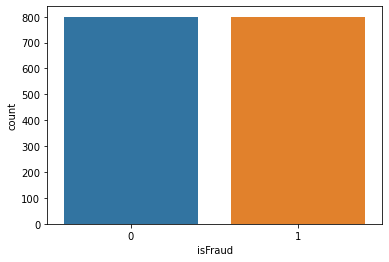

In [27]:
# Graph for clariffication

sns.countplot(x= 'isFraud', data= df)

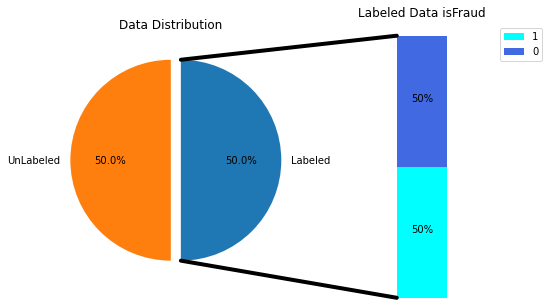

In [28]:
from matplotlib.patches import ConnectionPatch

fig = plt.figure(figsize=(9, 5.0625))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
fig.subplots_adjust(wspace=0)

# pie chart parameters
ratios = [.5, .5]
labels = ['Labeled', 'UnLabeled']
explode = [0.1, 0]
# rotate so that first wedge is split by the x-axis
angle = -180 * ratios[0]
ax1.pie(ratios, autopct='%1.1f%%', startangle=angle,
        labels=labels, explode=explode)

# bar chart parameters

xpos = 0
bottom = 0
ratios = [.5, .5]
width = .2
colors = [['cyan'], ['royalblue']]

for j in range(len(ratios)):
    height = ratios[j]
    ax2.bar(xpos, height, width, bottom=bottom, color=colors[j])
    ypos = bottom + ax2.patches[j].get_height() / 2
    bottom += height
    ax2.text(xpos, ypos, "%d%%" % (ax2.patches[j].get_height() * 100),
             ha='center')

ax2.set_title('Labeled Data isFraud')
ax2.legend(('1', '0'))
ax2.axis('off')
ax2.set_xlim(- 2.5 * width, 2.5 * width)

# use ConnectionPatch to draw lines between the two plots
# get the wedge data
theta1, theta2 = ax1.patches[0].theta1, ax1.patches[0].theta2
center, r = ax1.patches[0].center, ax1.patches[0].r
bar_height = sum([item.get_height() for item in ax2.patches])

# draw top connecting line
x = r * np.cos(np.pi / 180 * theta2) + center[0]
y = np.sin(np.pi / 180 * theta2) + center[1]
con = ConnectionPatch(xyA=(- width / 2, bar_height), xyB=(x, y),
                      coordsA="data", coordsB="data", axesA=ax2, axesB=ax1)
con.set_color([0, 0, 0])
con.set_linewidth(4)
ax2.add_artist(con)

# draw bottom connecting line
x = r * np.cos(np.pi / 180 * theta1) + center[0]
y = np.sin(np.pi / 180 * theta1) + center[1]
con = ConnectionPatch(xyA=(- width / 2, 0), xyB=(x, y), coordsA="data",
                      coordsB="data", axesA=ax2, axesB=ax1)

con.set_color([0, 0, 0])
ax2.add_artist(con)
con.set_linewidth(4)
ax1.set(title='Data Distribution')
plt.show()

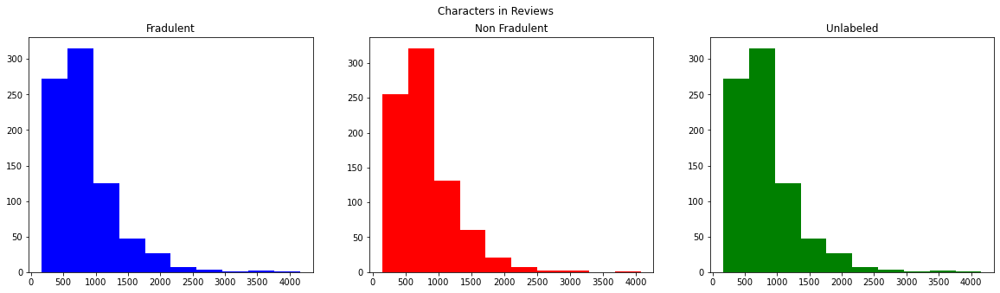

In [29]:
# Number of characters comparison graph for fradulent/non-fradulent comments 

fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(20,5))
df_len=df[df['isFraud']==0]['reviews'].str.len()
ax1.hist(df_len,color='blue')
ax1.set_title('Fradulent')

df_len1=df[df['isFraud']==1]['reviews'].str.len()
ax2.hist(df_len1,color='red')
ax2.set_title('Non Fradulent')
fig.suptitle('Characters in Reviews')

df_len3= df_unlabel['reviews'].str.len()
ax3.hist(df_len,color='green')
ax3.set_title('Unlabeled')

plt.show()

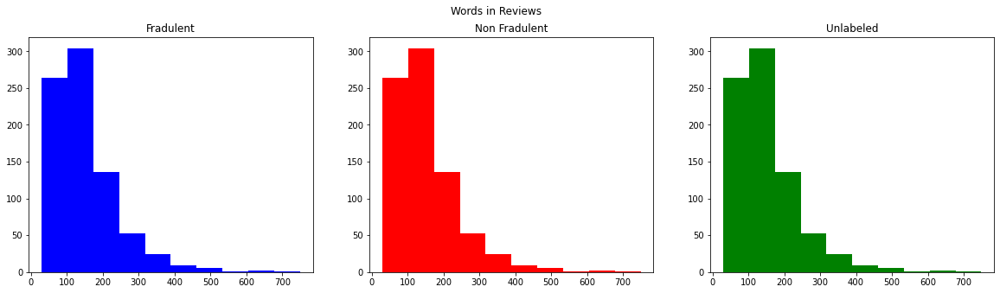

In [30]:
# Number of words comparison graph for fradulent/non-fradulent comments 

fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(20,5))
df_len=df[df['isFraud']==0]['reviews'].str.split().map(lambda x: len(x))
ax1.hist(df_len,color='blue')
ax1.set_title('Fradulent')

df_len1=df[df['isFraud']==1]['reviews'].str.split().map(lambda x: len(x))
ax2.hist(df_len,color='red')
ax2.set_title('Non Fradulent')
fig.suptitle('Words in Reviews')

df_len3= df_unlabel['reviews'].str.split().map(lambda x: len(x))
ax3.hist(df_len,color='green')
ax3.set_title('Unlabeled')


plt.show()

Text(0.5, 0.98, 'Average word length in each review')

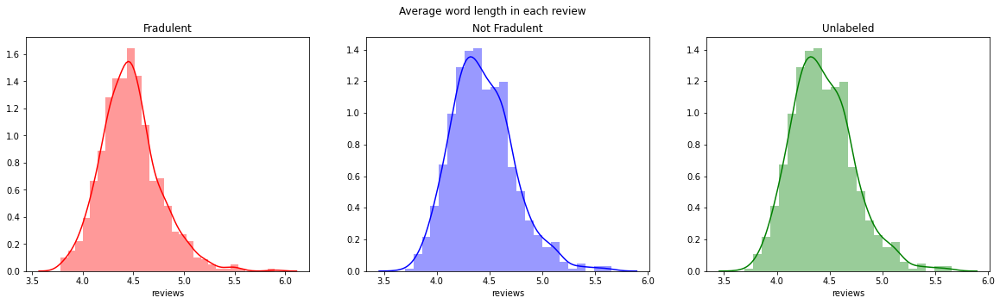

In [31]:
# Graph comparison for average word length

fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(20,5))
word=df[df['isFraud']==0]['reviews'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='red')

ax1.set_title('Fradulent')
word=df[df['isFraud']==1]['reviews'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='blue')
ax2.set_title('Not Fradulent')

df_len3= df_unlabel['reviews'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='green')
ax3.set_title('Unlabeled')

fig.suptitle('Average word length in each review')

In [32]:
# Creating corpus for isFraud as target

def create_corpus(isFraud):
    corpus=[]
    
    for x in df[df['isFraud']==isFraud]['reviews'].str.split():
        for i in x:
            corpus.append(i)
    return corpus

In [33]:
unlabel_corpus = []

for x in df_unlabel.reviews.str.split():
    for i in x:
        unlabel_corpus.append(i)


In [34]:
# setting up corpus stopword language

stop=set(stopwords.words('english'))

Text(0.5, 1.0, 'Not isFraud Stopwords Counts')

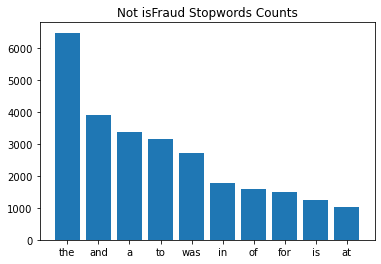

In [35]:
# Plotting counts of stopwords for isFraud = 0

corpus=create_corpus(0)

dic=defaultdict(int)
for word in corpus:
    if word in stop:
        dic[word]+=1
        
top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:10] 
x,y=zip(*top)
plt.bar(x,y)
plt.title('Not isFraud Stopwords Counts')

Text(0.5, 1.0, 'isFraud Stopwords Counts')

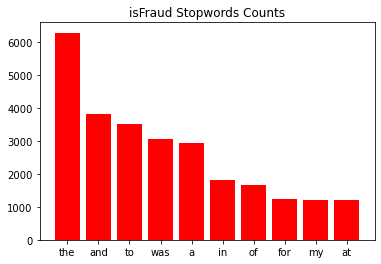

In [36]:
# Plotting counts of stopwords for isFraud = 1

corpus=create_corpus(1)

dic=defaultdict(int)
for word in corpus:
    if word in stop:
        dic[word]+=1

top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:10] 
    


x,y=zip(*top)
plt.bar(x,y, color='red')
plt.title('isFraud Stopwords Counts')

Text(0.5, 1.0, 'Unlabeled Stopwords Counts')

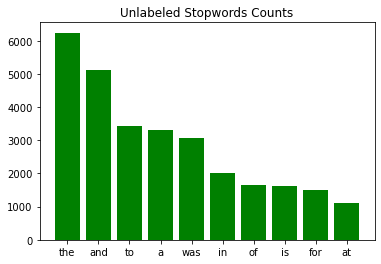

In [37]:
# Plotting counts of stopwords for unlabled

dic=defaultdict(int)

for word in unlabel_corpus:
    if word in stop:
        dic[word]+=1

top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:10] 
    


x,y=zip(*top)
plt.bar(x,y, color='green')
plt.title('Unlabeled Stopwords Counts')

Text(0.5, 1.0, 'Not isFraud Punctuation Counts')

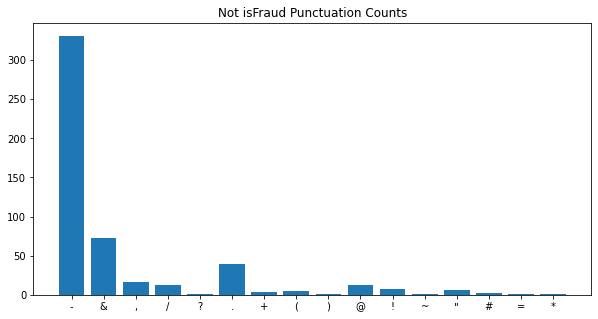

In [38]:
# Plotting punctuations for isFraud =1

plt.figure(figsize=(10,5))
corpus=create_corpus(0)

dic=defaultdict(int)
import string
special = string.punctuation
for i in (corpus):
    if i in special:
        dic[i]+=1
        
x,y=zip(*dic.items())
plt.bar(x,y)
plt.title('Not isFraud Punctuation Counts')

Text(0.5, 1.0, 'isFraud Punctuation Counts')

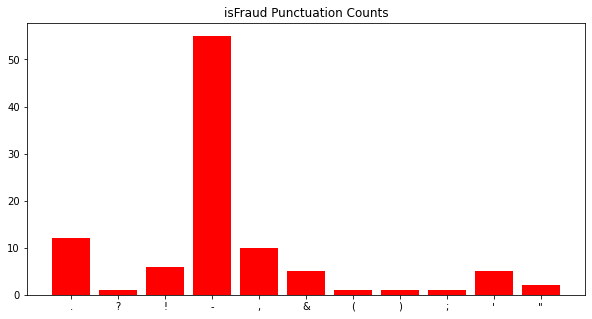

In [39]:
# Plotting punctuations for isFraud =0

plt.figure(figsize=(10,5))
corpus=create_corpus(1)

dic=defaultdict(int)
import string
special = string.punctuation
for i in (corpus):
    if i in special:
        dic[i]+=1
        
x,y=zip(*dic.items())
plt.bar(x,y,color='red')
plt.title('isFraud Punctuation Counts')

Text(0.5, 1.0, 'Unlabeled Punctuation Counts')

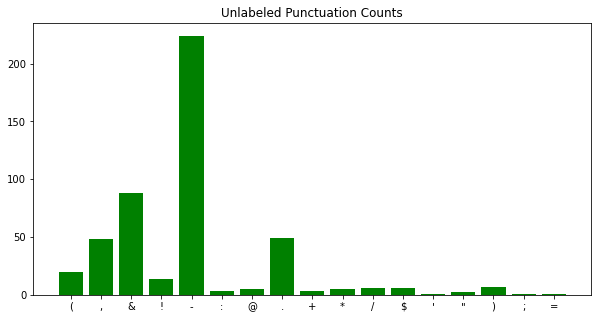

In [40]:
# Plotting punctuations for unlabeled

plt.figure(figsize=(10,5))
corpus=create_corpus(1)

dic=defaultdict(int)

special = string.punctuation
for i in unlabel_corpus:
    if i in special:
        dic[i]+=1
        
x,y=zip(*dic.items())
plt.bar(x,y, color='green')
plt.title('Unlabeled Punctuation Counts')

Text(0.5, 1.0, 'Common words Labeled df')

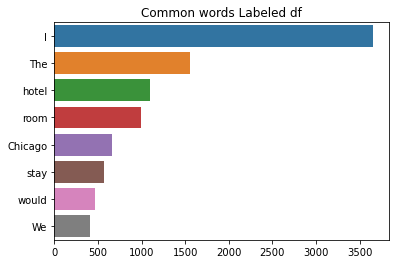

In [41]:
# Plot for the common words in general

counter=Counter(corpus)
most=counter.most_common()
x=[]
y=[]
for word,count in most[:40]:
    if (word not in stop) :
        x.append(word)
        y.append(count)

sns.barplot(x=y,y=x).set_title('Common words Labeled df')

Text(0.5, 1.0, 'Common words Unlabeled df')

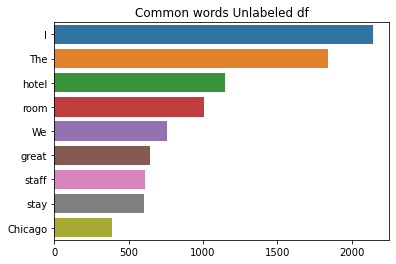

In [42]:
# Plot for the common words in general

counter=Counter(unlabel_corpus)
most=counter.most_common()
x=[]
y=[]
for word,count in most[:40]:
    if (word not in stop) :
        x.append(word)
        y.append(count)

sns.barplot(x=y,y=x).set_title('Common words Unlabeled df')

#### Ngram analysis

In [43]:
# Function to fetch bigram 

def get_bigrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

Text(0.5, 1.0, 'Bigram Labeled df')

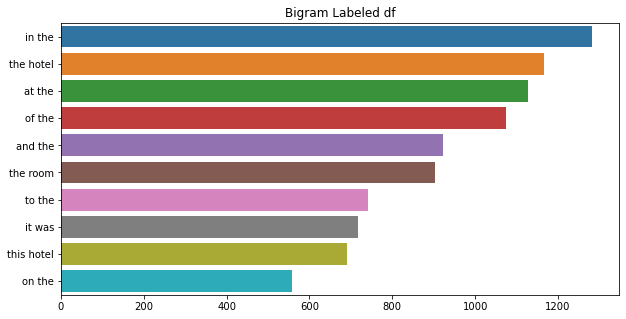

In [44]:
# Plotting bigram frequency graph

plt.figure(figsize=(10,5))
top_review_bigrams=get_bigrams(df['reviews'])[:10]
x,y=map(list,zip(*top_review_bigrams))
sns.barplot(x=y,y=x).set_title('Bigram Labeled df')

Text(0.5, 1.0, 'Bigram Unlabeled df')

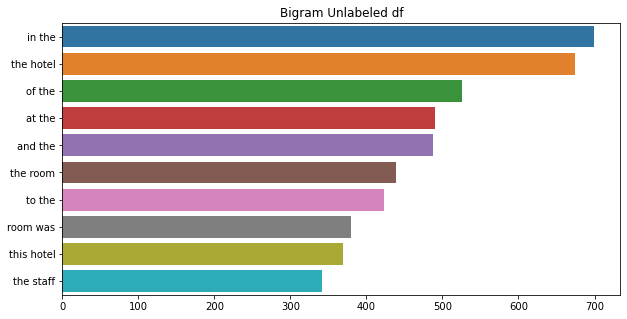

In [45]:
plt.figure(figsize=(10,5))
top_review_bigrams=get_bigrams(df_unlabel['reviews'])[:10]
x,y=map(list,zip(*top_review_bigrams))
sns.barplot(x=y,y=x).set_title('Bigram Unlabeled df')

# Data Cleaning

In [46]:
# Function to clean words
# \n mathces new lines
# \W matches nonword character, \w matches single word character
# \S matches non-whitespace, \s oppposite
# \D matches non-digit, \d opposite
# <.*?>+ matches non-greedy smallest numbers, <.*> matches greedy


def text_cleaning(text):
 
    text = re.sub('\[.*?\]', '', text)            
    text = text.lower() # lowers capitalized letters
    text = re.sub("\\W"," ",text) # remove special chars
    text = re.sub('https?://\S+|www\.\S+', '', text) # remove links
    text = re.sub('<.*?>+', '', text) # Repitition match
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text) # remove punctuation
    text = re.sub('\n', '', text) # removes new lines
    text = re.sub('\w*\d\w*', '', text) #remove words containing numbers
    
    
    return text

def deEmojify(text):
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)
    return regrex_pattern.sub(r'',text)


In [47]:
# Applying text cleaning to labeled data
df['reviews'] = df.reviews.apply(text_cleaning)
df['reviews'] = df.reviews.apply(deEmojify)

In [48]:
# Applying text cleaning to unlabeled data
df_unlabel['reviews'] = df_unlabel.reviews.apply(text_cleaning)
df_unlabel['reviews'] = df_unlabel.reviews.apply(deEmojify)

In [49]:
# Checking 
df

,reviews,isFraud,negative
0,i was completely blown away by this hotel it was magnificent i got a great deal and i am so ha...,0,0
1,we ve just returned from a two night stay at the affinia chicago and our visit was delightful t...,0,0
2,excellent location feels like a boutique hotel right next to neiman marcus v expensive dept s...,0,0
3,i travel a lot for business and quite frankly my expectations were starting to reach new lows ...,0,0
4,we visited for my birthday we had never been to chicago so was not sure where to stay found t...,0,0
5,as others have said once all the construction works are completed i suspect that the prices thi...,0,0
6,i checked in at the affinia hotel in chicago shortly after dinner on tuesday i was greeted by v...,0,0
7,i had a large roomy clean bed room with a large bathroom big minibar snack assortment and wa...,0,0
8,this was a great hotel right in the heart of the chicago loop within walking distance to the do...,0,0
9,this hotel was perfect for our girls getaway the decor is fun refreshing loved the roof top ...,0,0


In [50]:
# Checking 2
df_unlabel

,reviews
0,we had a great stay the location was convenient to everything we found a great place for break...
1,my parents came to this hotel in august because i was having a family reunion at home and it was...
2,the staff was amazing and offered such great advice on tours and food options the hotel is per...
3,we stayed at the kinzie this past weekend and we were greeted by arturo garza he was one the th...
4,the staff was very welcoming from walking through the doors the suite omg the pictures are no...
5,it was the first time my friends and i stayed at the kinzie hotel and we were so happy arturo to...
6,i had the pleasure of staying at the kinzie hotel while waiting on my apartment to be ready i w...
7,we were very pleased with our stay at the hotel theas very cozy clean and comfortable we trul...
8,great hotel in the middle of everything great rooms i had a suite it was one of the best v...
9,this would be a nice hotel if it were stars but rating it as a four star hotel is unrealistic ...


In [51]:
# Lemmatize sentences
lemmatizer = nltk.stem.WordNetLemmatizer()
wordnet_lemmatizer = WordNetLemmatizer()

def nltk_tag_to_wordnet_tag(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:
        return None

def lemmatize_sentence(sentence):
    #tokenize the sentence and find the POS tag for each token
    nltk_tagged = nltk.pos_tag(nltk.word_tokenize(sentence))
    #tuple of (token, wordnet_tag)
    wordnet_tagged = map(lambda x: (x[0], nltk_tag_to_wordnet_tag(x[1])), nltk_tagged)
    lemmatized_sentence = []
    for word, tag in wordnet_tagged:
        if tag is None:
            #if there is no available tag, append the token as is
            lemmatized_sentence.append(word)
        else:
            #else use the tag to lemmatize the token
            lemmatized_sentence.append(lemmatizer.lemmatize(word, tag))
    return " ".join(lemmatized_sentence)

In [52]:
# Applying Lemmatizing for labeled
df['reviews'] = df['reviews'].apply(lambda x: lemmatize_sentence(x))
df

,reviews,isFraud,negative
0,i be completely blow away by this hotel it be magnificent i get a great deal and i be so happy t...,0,0
1,we ve just return from a two night stay at the affinia chicago and our visit be delightful thank...,0,0
2,excellent location feel like a boutique hotel right next to neiman marcus v expensive dept store...,0,0
3,i travel a lot for business and quite frankly my expectation be start to reach new low i usually...,0,0
4,we visit for my birthday we have never be to chicago so be not sure where to stay found the deal...,0,0
5,as others have say once all the construction work be complete i suspect that the price this hote...,0,0
6,i check in at the affinia hotel in chicago shortly after dinner on tuesday i be greet by very fr...,0,0
7,i have a large roomy clean bed room with a large bathroom big minibar snack assortment and be tu...,0,0
8,this be a great hotel right in the heart of the chicago loop within walk distance to the downtow...,0,0
9,this hotel be perfect for our girl getaway the decor be fun refresh love the roof top bar every ...,0,0


In [53]:
# Applying Lemmatizing for unlabeled
df_unlabel['reviews'] = df_unlabel['reviews'].apply(lambda x: lemmatize_sentence(x))
df_unlabel

,reviews
0,we have a great stay the location be convenient to everything we find a great place for breakfas...
1,my parent come to this hotel in august because i be have a family reunion at home and it be too ...
2,the staff be amazing and offer such great advice on tour and food option the hotel be perfectly ...
3,we stay at the kinzie this past weekend and we be greet by arturo garza he be one the the most g...
4,the staff be very welcome from walk through the door the suite omg the picture be nothing compar...
5,it be the first time my friend and i stay at the kinzie hotel and we be so happy arturo take suc...
6,i have the pleasure of stay at the kinzie hotel while wait on my apartment to be ready i would l...
7,we be very pleased with our stay at the hotel theas very cozy clean and comfortable we truly enj...
8,great hotel in the middle of everything great room i have a suite it be one of the best view of ...
9,this would be a nice hotel if it be star but rating it as a four star hotel be unrealistic our r...


In [54]:
# Removing stop words for labeled ones

stop = stopwords.words('english')
df.reviews = df.reviews.apply(lambda x: ' '.join([item for item in x.split() if item not in stop]))
df

,reviews,isFraud,negative
0,completely blow away hotel magnificent get great deal happy stay arrive nervous read bad review ...,0,0
1,return two night stay affinia chicago visit delightful thanks tripadvisor review prepare major c...,0,0
2,excellent location feel like boutique hotel right next neiman marcus v expensive dept store min ...,0,0
3,travel lot business quite frankly expectation start reach new low usually always choose w hotel ...,0,0
4,visit birthday never chicago sure stay found deal hotel travelzoo great rate staff awesome helpf...,0,0
5,others say construction work complete suspect price hotel legitimately charge put price range pi...,0,0
6,check affinia hotel chicago shortly dinner tuesday greet frendly staff valet service front desk ...,0,0
7,large roomy clean bed room large bathroom big minibar snack assortment tuck away nicely corner h...,0,0
8,great hotel right heart chicago loop within walk distance downtown attraction parking expensive ...,0,0
9,hotel perfect girl getaway decor fun refresh love roof top bar every staff member friendly alway...,0,0


In [55]:
# Removing stop words for unlabeled ones

df_unlabel['reviews'] = df_unlabel['reviews'].apply(lambda x: ' '.join([item for item in x.split() if item not in stop]))
df_unlabel

,reviews
0,great stay location convenient everything find great place breakfast nearby yolk corner king roo...
1,parent come hotel august family reunion home small accommodate would like thank staff kindness m...
2,staff amazing offer great advice tour food option hotel perfectly locate lot walk option ton won...
3,stay kinzie past weekend greet arturo garza one genuine nice person yet encounter hotel extremel...
4,staff welcome walk door suite omg picture nothing compare beautiful definitely back thank hospit...
5,first time friend stay kinzie hotel happy arturo take good care us arturo make check process eas...
6,pleasure stay kinzie hotel wait apartment ready would like say front desk guy nico soo pleasant ...
7,pleased stay hotel theas cozy clean comfortable truly enjoy large tube wish shower attachment he...
8,great hotel middle everything great room suite one best view city ever great great great walk di...
9,would nice hotel star rating four star hotel unrealistic room mold grow ceiling wall bang defini...


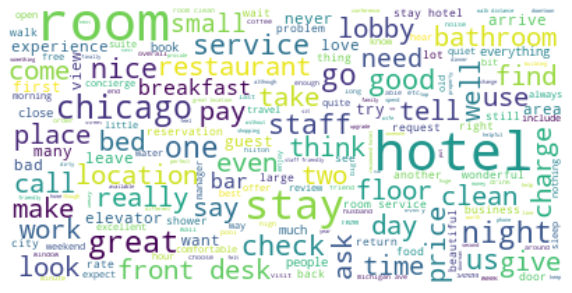

In [56]:
# Word cloud for isFraud=0 after cleaning

df_Notfr = df.loc[df['isFraud'] == 0].reviews.values
Notfr = ' '.join(df_Notfr).replace("\n"," ")


wc = WordCloud(max_font_size=40, background_color='white').generate(Notfr)

plt.figure(figsize=(10,20))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

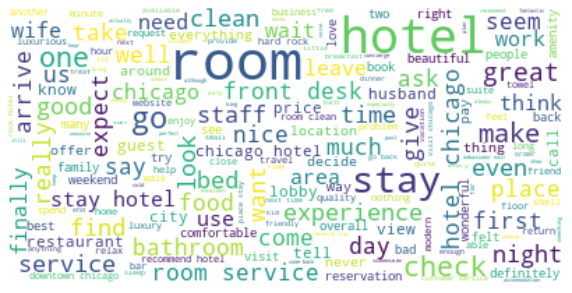

In [57]:
# Word cloud for isFraud=1 after cleaning

df_Notfr = df.loc[df['isFraud'] == 1].reviews.values
Notfr = ' '.join(df_Notfr).replace("\n"," ")


wc = WordCloud(max_font_size=40, background_color='white').generate(Notfr)

plt.figure(figsize=(10,20))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

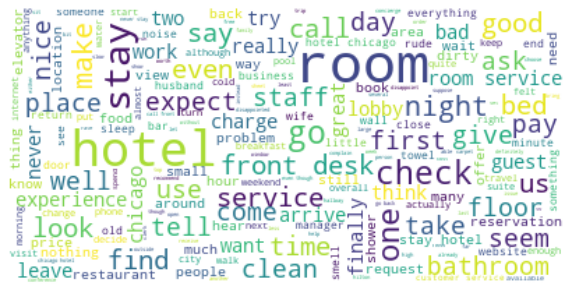

In [58]:
# Word cloud for negative comments

wc = WordCloud()

df_fr = df.loc[df['negative'] == 1].reviews.values
fr = ' '.join(df_fr).replace("\n"," ")


wc = WordCloud(max_font_size=40, background_color='white').generate(fr)

plt.figure(figsize=(10,20))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

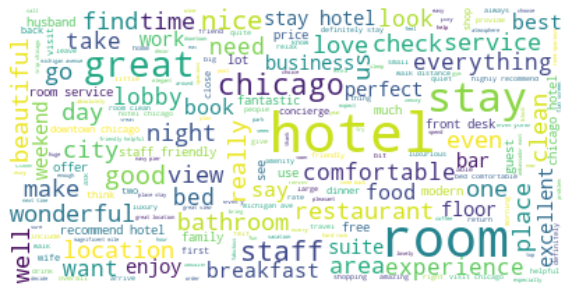

In [59]:
# Word cloud for positive comments


wc = WordCloud()

df_fr = df.loc[df['negative'] == 0].reviews.values
fr = ' '.join(df_fr).replace("\n"," ")


wc = WordCloud(max_font_size=40, background_color='white').generate(fr)

plt.figure(figsize=(10,20))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

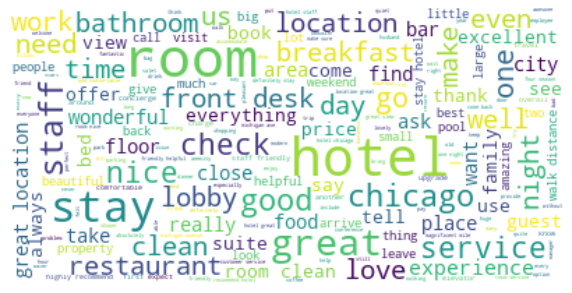

In [60]:
# Word cloud for positive comments


wc = WordCloud()

unlabel = df_unlabel['reviews']
fr = ' '.join(unlabel).replace("\n"," ")


wc = WordCloud(max_font_size=40, background_color='white').generate(fr)

plt.figure(figsize=(10,20))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

## Predictive Modeling

### Logistics Regression Model

Popular method of various classification problems, Logistic Regression predicts the probability of occurrence of a binary event utilizing a logit function.

- The dependent variable in logistic regression follows Bernoulli Distribution.
- Estimation is done through maximum likelihood.
- No R Square, Model fitness is calculated through Concordance, KS-Statistics.


#### Counter Vectorizer

- Convert a collection of text documents to a matrix of token counts


#### TF-IDF
- stands for “Term Frequency – Inverse Document” Frequency which are the components of the resulting scores assigned to each word.
- The TfidfVectorizer will tokenize documents, learn the vocabulary and inverse document frequency weightings, and allow you to encode new documents.

In [61]:
# Setting up targets
x= df.reviews
y= df.isFraud

In [62]:
# Split test and train for 8:2 ratio
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0,test_size=0.2)

#### Count Vectorizer LogisticRegression model

In [63]:
# Vectorizing using CountVectorizor

cv=CountVectorizer(ngram_range=(1,2))

x_train_cvec =cv.fit_transform(x_train)
x_test_cvec = cv.transform(x_test)

In [64]:
# PCA Plot Function

def plot_PCA(train, test, savepath="PCA_demo.csv", plot=True):
        pca = TruncatedSVD(n_components=2)
        pca.fit(train)
        pca_scores = pca.transform(train)
        color_mapper = {label:idx for idx,label in enumerate(set(test))}
        color_column = [color_mapper[label] for label in test]
        colors = ['orange','blue']
        if plot:
            plt.scatter(pca_scores[:,0], pca_scores[:,1], s=8, alpha=.8, c=test, cmap=matplotlib.colors.ListedColormap(colors))
            orange_patch = mpatches.Patch(color='orange', label='isFraud')
            blue_patch = mpatches.Patch(color='blue', label='Real')
            plt.legend(handles=[orange_patch, blue_patch], prop={'size': 15})


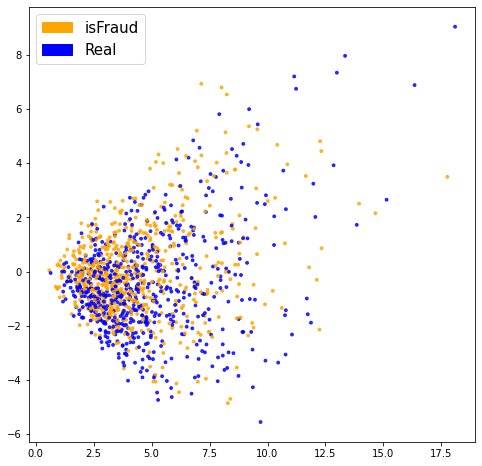

In [65]:
# Plotting for CountVectorized train values

fig = plt.figure(figsize=(8, 8))          
plot_PCA(x_train_cvec, y_train)
plt.show()

In [66]:
# Fitting model using LogisticRegression

lr=LogisticRegression(max_iter=20000)
lr.fit(x_train_cvec,y_train)
pred_LR_cv=lr.predict(x_test_cvec)
LogisticsRegression_cv =accuracy_score(y_test,pred_LR_cv)
print("Accuracy: %.2f%%" % (LogisticsRegression_cv*100.0))

Accuracy: 85.62%


In [67]:
# Confusion matrix

print(confusion_matrix(y_test, pred_LR_cv))

[[134  28]
 [ 18 140]]


In [68]:
# Classification Report

print(classification_report(y_test, pred_LR_cv))

              precision    recall  f1-score   support

           0       0.88      0.83      0.85       162
           1       0.83      0.89      0.86       158

    accuracy                           0.86       320
   macro avg       0.86      0.86      0.86       320
weighted avg       0.86      0.86      0.86       320



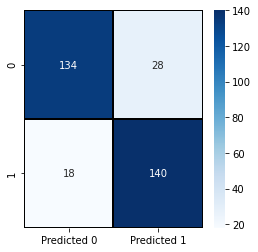

In [69]:
# Pretty version of confusion matrix

cm = confusion_matrix(y_test,pred_LR_cv)
cm = pd.DataFrame(cm , index = ['0','1'] , columns = ['0','1'])
plt.figure(figsize = (4,4))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black' , 
            linewidth = 1 , 
            annot = True, fmt='' , 
            xticklabels = ['Predicted 0','Predicted 1'] , 
            yticklabels = ['0','1'])

In [70]:
# 5 fold validation model to just make sure

X=cv.fit_transform(x)

skfold = StratifiedKFold(n_splits=5, random_state=100)
model_skfold = LogisticRegression()
results_skfold = model_selection.cross_val_score(model_skfold, X, y, cv=skfold)
print("Accuracy: %.2f%%" % (results_skfold.mean()*100.0))

Accuracy: 85.81%


#### TF-IDF LogisticRegression model

In [71]:
# Vectorizing using TF-IDF vectorizer

vect_word = TfidfVectorizer(analyzer='word',stop_words= 'english',ngram_range=(1,2),dtype=np.float32)
x_train_tfidf = vect_word.fit_transform(x_train)
x_test_tfidf = vect_word.transform(x_test)

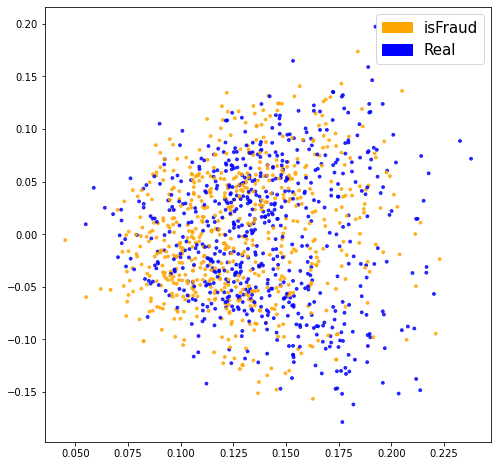

In [72]:
# PCA plot for TF-IDF vectorizer
fig = plt.figure(figsize=(8, 8))          
plot_PCA(x_train_tfidf, y_train)
plt.show()

In [73]:
# Building TF-IDF LogisticRegression model

lr=LogisticRegression(max_iter=20000)
lr.fit(x_train_tfidf,y_train)
pred_LR_tfidf=lr.predict(x_test_tfidf)

In [74]:
# Accuracy

LogisticsRegression_tfidf =accuracy_score(y_test,pred_LR_tfidf)*100
print("Accuracy: %.2f%%" % (LogisticsRegression_tfidf*100.0))

Accuracy: 8218.75%


In [75]:
# Basic confusion matrix

print(confusion_matrix(y_test, pred_LR_tfidf))

[[122  40]
 [ 17 141]]


In [76]:
# Classification report

print(classification_report(y_test, pred_LR_tfidf))

              precision    recall  f1-score   support

           0       0.88      0.75      0.81       162
           1       0.78      0.89      0.83       158

    accuracy                           0.82       320
   macro avg       0.83      0.82      0.82       320
weighted avg       0.83      0.82      0.82       320



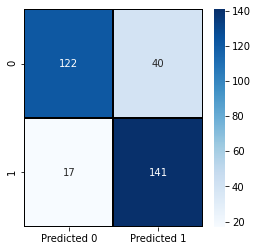

In [77]:
# Pretty version of confusion matrix of TFIDF LR model

cm = confusion_matrix(y_test,pred_LR_tfidf)
cm = pd.DataFrame(cm , index = ['0','1'] , columns = ['0','1'])
plt.figure(figsize = (4,4))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black' , 
            linewidth = 1 , 
            annot = True, fmt='' , 
            xticklabels = ['Predicted 0','Predicted 1'] , 
            yticklabels = ['0','1'])

In [78]:
# Cross validation for 5 fold for TFIDF

X= vect_word.fit_transform(x)

skfold = StratifiedKFold(n_splits=5, random_state=100)
model_skfold = LogisticRegression()
results_skfold = model_selection.cross_val_score(model_skfold, X, y, cv=skfold)
print("Accuracy: %.2f%%" % (results_skfold.mean()*100.0))

Accuracy: 86.38%


### Support Vector Machine Model

#### SVM CV

In [79]:
# Fitting it right away, linear model with Countvectorizor

svm=SVC(kernel = 'linear')
svm.fit(x_train_cvec,y_train)
SCV_pred_CV=svm.predict(x_test_cvec)
SCV_pred_CV_score = accuracy_score(y_test,SCV_pred_CV)
print("Accuracy: %.2f%%" % (SCV_pred_CV_score*100.0))

Accuracy: 85.94%


In [80]:
# Confusion matrix

print(confusion_matrix(y_test, SCV_pred_CV))

[[139  23]
 [ 22 136]]


In [81]:
# Classification reports

print(classification_report(y_test, SCV_pred_CV))

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       162
           1       0.86      0.86      0.86       158

    accuracy                           0.86       320
   macro avg       0.86      0.86      0.86       320
weighted avg       0.86      0.86      0.86       320



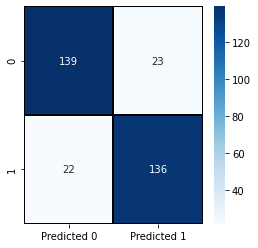

In [82]:
# Pretty confusion matrix

cm = confusion_matrix(y_test,SCV_pred_CV)
cm = pd.DataFrame(cm , index = ['0','1'] , columns = ['0','1'])
plt.figure(figsize = (4,4))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black' , 
            linewidth = 1 , 
            annot = True, fmt='' , 
            xticklabels = ['Predicted 0','Predicted 1'] , 
            yticklabels = ['0','1'])

In [83]:
# 5 fold cross validation

X=cv.fit_transform(x)

skfold = StratifiedKFold(n_splits=5, random_state=100)
model_skfold = SVC(kernel='linear')
results_skfold = model_selection.cross_val_score(model_skfold, X, y, cv=skfold)
print("Accuracy: %.2f%%" % (results_skfold.mean()*100.0))

Accuracy: 85.25%


#### SVM TF-IDF

In [84]:
# SVM TF-IDF model

svm.fit(x_train_tfidf,y_train)
SCV_pred_tfidf=svm.predict(x_test_tfidf)
SCV_pred_tfidf_score = accuracy_score(y_test,SCV_pred_tfidf)

print("Accuracy: %.2f%%" % (SCV_pred_tfidf_score*100.0))

Accuracy: 85.31%


In [85]:
# Confusion Matrix

print(confusion_matrix(y_test, SCV_pred_tfidf))

[[132  30]
 [ 17 141]]


In [86]:
# Classification report

print(classification_report(y_test, SCV_pred_tfidf))

              precision    recall  f1-score   support

           0       0.89      0.81      0.85       162
           1       0.82      0.89      0.86       158

    accuracy                           0.85       320
   macro avg       0.86      0.85      0.85       320
weighted avg       0.86      0.85      0.85       320



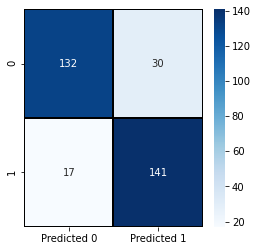

In [87]:
# Pretty Confusion matrix

cm = confusion_matrix(y_test,SCV_pred_tfidf)
cm = pd.DataFrame(cm , index = ['0','1'] , columns = ['0','1'])
plt.figure(figsize = (4,4))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black' , 
            linewidth = 1 , 
            annot = True, fmt='' , 
            xticklabels = ['Predicted 0','Predicted 1'] , 
            yticklabels = ['0','1'])

In [88]:
# 5 fold cross validation

X= vect_word.fit_transform(x)

skfold = StratifiedKFold(n_splits=5, random_state=100)
model_skfold = SVC(kernel ='linear')
results_skfold = model_selection.cross_val_score(model_skfold, X, y, cv=skfold)
print("Accuracy: %.2f%%" % (results_skfold.mean()*100.0))

Accuracy: 87.69%


### Multinomial Naive Bayes Classifier 

#### Multinomial Naive Bayse Count Vectorizer Model

In [89]:
# Multinomial Naive Bayse Count Vectorizer Model

nb=MultinomialNB()
nb.fit(x_train_cvec,y_train)
MNB_pred_CV = nb.predict(x_test_cvec)
MNB_pred_CV_score = accuracy_score(y_test, MNB_pred_CV)
print("Accuracy: %.2f%%" % (MNB_pred_CV_score*100.0))

Accuracy: 85.62%


In [90]:
# CM

print(confusion_matrix(y_test, MNB_pred_CV))

[[126  36]
 [ 10 148]]


In [91]:
# classification report

print(classification_report(y_test, MNB_pred_CV))

              precision    recall  f1-score   support

           0       0.93      0.78      0.85       162
           1       0.80      0.94      0.87       158

    accuracy                           0.86       320
   macro avg       0.87      0.86      0.86       320
weighted avg       0.87      0.86      0.86       320



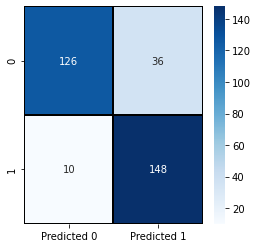

In [92]:
# Pretty CM

cm = confusion_matrix(y_test, MNB_pred_CV)
cm = pd.DataFrame(cm , index = ['0','1'] , columns = ['0','1'])
plt.figure(figsize = (4,4))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black' , 
            linewidth = 1 , 
            annot = True, fmt='' , 
            xticklabels = ['Predicted 0','Predicted 1'] , 
            yticklabels = ['0','1'])

In [93]:
# 5 fold cross validation model

X= cv.fit_transform(x)

skfold = StratifiedKFold(n_splits=5, random_state=100)
model_skfold = MultinomialNB()
results_skfold = model_selection.cross_val_score(model_skfold, X, y, cv=skfold)
print("Accuracy: %.2f%%" % (results_skfold.mean()*100.0))

Accuracy: 87.69%


#### Multinomial Naive Base TF-IDF Model

In [94]:
# Fitting the model

nb=MultinomialNB()
nb.fit(x_train_tfidf,y_train)
MNB_pred_tfidf = nb.predict(x_test_tfidf)
MNB_pred_tfidf_score = accuracy_score(y_test, MNB_pred_tfidf)
print("Accuracy: %.2f%%" % (MNB_pred_tfidf_score*100.0))

Accuracy: 84.69%


In [95]:
# CM

print(confusion_matrix(y_test, MNB_pred_tfidf))

[[122  40]
 [  9 149]]


In [96]:
# Classification report

print(classification_report(y_test, MNB_pred_tfidf))

              precision    recall  f1-score   support

           0       0.93      0.75      0.83       162
           1       0.79      0.94      0.86       158

    accuracy                           0.85       320
   macro avg       0.86      0.85      0.85       320
weighted avg       0.86      0.85      0.85       320



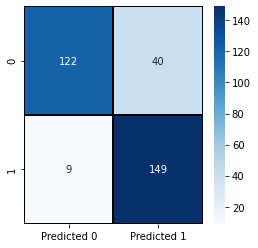

In [97]:
# Pretty CM

cm = confusion_matrix(y_test, MNB_pred_tfidf)
cm = pd.DataFrame(cm , index = ['0','1'] , columns = ['0','1'])
plt.figure(figsize = (4,4))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black' , 
            linewidth = 1 , 
            annot = True, fmt='' , 
            xticklabels = ['Predicted 0','Predicted 1'] , 
            yticklabels = ['0','1'])

In [98]:
# 5 fold CV

X= vect_word.fit_transform(x)

skfold = StratifiedKFold(n_splits=5, random_state=100)
model_skfold = MultinomialNB()
results_skfold = model_selection.cross_val_score(model_skfold, X, y, cv=skfold)
print("Accuracy: %.2f%%" % (results_skfold.mean()*100.0))

Accuracy: 86.31%


Real quick, comparing with even more classifiers. Countvectorization vs TFIDF Vectorization

In [99]:
# With TF-IDF 

x= df.reviews
y= df.isFraud

vect_word = TfidfVectorizer(analyzer='word',stop_words= 'english',ngram_range=(1,2),dtype=np.float32)
x_train1 = vect_word.fit_transform(x)


models = [
 XGBClassifier(),
 MultinomialNB(),
 SVC(kernel='linear'),
 LogisticRegression(max_iter=20000),
 KNeighborsClassifier(),
 RandomForestClassifier(),
 GradientBoostingClassifier()
]

for model in models:
    model.seed = 42
    num_folds = 5

    scores = cross_val_score(model, x_train1, y, cv=num_folds)
    score_description = " %0.2f (+/- %0.2f)" % (scores.mean()*100.0, scores.std() * 2)

    print('{model:25} CV-5 Accuracy: {score}'.format(
     model=model.__class__.__name__,
     score=score_description
     ))


XGBClassifier             CV-5 Accuracy:  81.56 (+/- 0.03)
MultinomialNB             CV-5 Accuracy:  86.31 (+/- 0.05)
SVC                       CV-5 Accuracy:  87.69 (+/- 0.03)
LogisticRegression        CV-5 Accuracy:  86.38 (+/- 0.04)
KNeighborsClassifier      CV-5 Accuracy:  74.38 (+/- 0.06)
RandomForestClassifier    CV-5 Accuracy:  82.94 (+/- 0.05)
GradientBoostingClassifier CV-5 Accuracy:  79.94 (+/- 0.03)


In [100]:
# With Counter Vectorization

x= df.reviews
y= df.isFraud

x_train2 = cv.fit_transform(x)


models = [
 XGBClassifier(),
 MultinomialNB(),
 SVC(kernel='linear'),
 LogisticRegression(max_iter=20000),
 KNeighborsClassifier(),
 RandomForestClassifier(),
 GradientBoostingClassifier()
]

for model in models:
    model.seed = 42
    num_folds = 5

    scores = cross_val_score(model, x_train2, y, cv=num_folds)
    score_description = " %0.2f (+/- %0.2f)" % (scores.mean()*100.0, scores.std() * 2)

    print('{model:25} CV-5 Accuracy: {score}'.format(
     model=model.__class__.__name__,
     score=score_description
     ))


XGBClassifier             CV-5 Accuracy:  81.06 (+/- 0.03)
MultinomialNB             CV-5 Accuracy:  87.69 (+/- 0.06)
SVC                       CV-5 Accuracy:  85.25 (+/- 0.02)
LogisticRegression        CV-5 Accuracy:  85.81 (+/- 0.03)
KNeighborsClassifier      CV-5 Accuracy:  52.06 (+/- 0.01)
RandomForestClassifier    CV-5 Accuracy:  83.44 (+/- 0.04)
GradientBoostingClassifier CV-5 Accuracy:  80.94 (+/- 0.04)


### Word2Vec Neural Network Model
- Developed by Google

In [65]:



# Converting text to format for Genism

words = []
for i in df.reviews.values:
    words.append(i.split())
words[:5]

[['completely',
  'blow',
  'away',
  'hotel',
  'magnificent',
  'get',
  'great',
  'deal',
  'happy',
  'stay',
  'arrive',
  'nervous',
  'read',
  'bad',
  'review',
  'impact',
  'renovation',
  'people',
  'stay',
  'example',
  'noisy',
  'however',
  'whilst',
  'renovation',
  'still',
  'go',
  'gym',
  'open',
  'restaurant',
  'make',
  'difference',
  'room',
  'huge',
  'bathroom',
  'spacious',
  'excellent',
  'water',
  'pressure',
  'bed',
  'perfect',
  'view',
  'amazing',
  'hotel',
  'close',
  'great',
  'shop',
  'magnificent',
  'mile',
  'plus',
  'comfortable',
  'walk',
  'distance',
  'hancock',
  'tower',
  'millennium',
  'park'],
 ['return',
  'two',
  'night',
  'stay',
  'affinia',
  'chicago',
  'visit',
  'delightful',
  'thanks',
  'tripadvisor',
  'review',
  'prepare',
  'major',
  'construction',
  'work',
  'facade',
  'entrance',
  'mess',
  'hotel',
  'restaurant',
  'bar',
  'remain',
  'incomplete',
  'unavailable',
  'even',
  'part',
  'l

In [66]:
# load the whole embedding into memory
embedding_index = dict()
f = open('glove.6B.200d.txt', encoding="utf8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embedding_index[word] = coefs
f.close()
print('Loaded %s word vectors.' % len(embedding_index))




Loaded 400000 word vectors.


In [67]:
import gensim
#Dimension of vectors we are generating
EMBEDDING_DIM = 200

#Creating Word Vectors by Word2Vec Method (takes time...)
w2v_model = gensim.models.Word2Vec(sentences = words , size=EMBEDDING_DIM , window = 5 , min_count = 1)

In [68]:
#vocab size
len(w2v_model.wv.vocab)

7375

In [69]:
from keras.preprocessing import text, sequence

tokenizer = text.Tokenizer(num_words=35000)
tokenizer.fit_on_texts(words)
tokenized_train = tokenizer.texts_to_sequences(words)
x = sequence.pad_sequences(tokenized_train, maxlen = 20)

In [70]:
# Adding 1 because of reserved 0 index
# Embedding Layer creates one more vector for "UNKNOWN" words, or padded words (0s). This Vector is filled with zeros.
# Thus our vocab size inceeases by 1
vocab_size = len(tokenizer.word_index) + 1

In [71]:
# Function to create weight matrix from word2vec gensim model
def get_weight_matrix(model, vocab):
    # total vocabulary size plus 0 for unknown words
    vocab_size = len(vocab) + 1
    # define weight matrix dimensions with all 0
    weight_matrix = np.zeros((vocab_size, EMBEDDING_DIM))
    # step vocab, store vectors using the Tokenizer's integer mapping
    for word, i in vocab.items():
        weight_matrix[i] = model[word]
    return weight_matrix

In [72]:
#Getting embedding vectors from word2vec and usings it as weights of non-trainable keras embedding layer
embedding_vectors = get_weight_matrix(w2v_model, tokenizer.word_index)

In [73]:
#Defining Neural Network
model = Sequential()
#Non-trainable embeddidng layer
model.add(Embedding(vocab_size, output_dim=EMBEDDING_DIM, weights=[embedding_vectors], input_length=20, trainable=True))
#LSTM 
model.add(Bidirectional(LSTM(units=128 , recurrent_dropout = 0.3 , dropout = 0.3,return_sequences = True)))
model.add(Bidirectional(GRU(units=32 , recurrent_dropout = 0.1 , dropout = 0.1)))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer=keras.optimizers.Adam(lr = 0.01), loss='binary_crossentropy', metrics=['acc'])

del embedding_vectors

In [74]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 20, 200)           1475200   
_________________________________________________________________
bidirectional (Bidirectional (None, 20, 256)           336896    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 64)                55680     
_________________________________________________________________
dense (Dense)                (None, 1)                 65        
Total params: 1,867,841
Trainable params: 1,867,841
Non-trainable params: 0
_________________________________________________________________


In [75]:
# Splitting again

x_train, x_test, y_train, y_test = train_test_split(x, df.isFraud , test_size = 0.3 , random_state = 0) 

In [76]:
# Fitting model

result1 = model.fit(x_train, y_train, batch_size = 128 , validation_data = (x_test,y_test) , epochs = 3)

Epoch 1/3
9/9 [==============================] - 3s 328ms/step - loss: 1.1881 - acc: 0.5071 - val_loss: 0.8155 - val_acc: 0.4750
Epoch 2/3
9/9 [==============================] - 2s 167ms/step - loss: 0.7310 - acc: 0.5054 - val_loss: 0.6934 - val_acc: 0.5167
Epoch 3/3
9/9 [==============================] - 2s 170ms/step - loss: 0.6765 - acc: 0.5580 - val_loss: 0.7013 - val_acc: 0.4688


In [77]:
# Accuracy

print("Accuracy of the model on Training Data is - " , model.evaluate(x_train,y_train)[1]*100)
print("Accuracy of the model on Testing Data is - " , model.evaluate(x_test,y_test)[1]*100)

35/35 [==============================] - 0s 14ms/step - loss: 0.6561 - acc: 0.5893
Accuracy of the model on Training Data is -  58.92857313156128
15/15 [==============================] - 0s 14ms/step - loss: 0.7013 - acc: 0.4688
Accuracy of the model on Testing Data is -  46.875


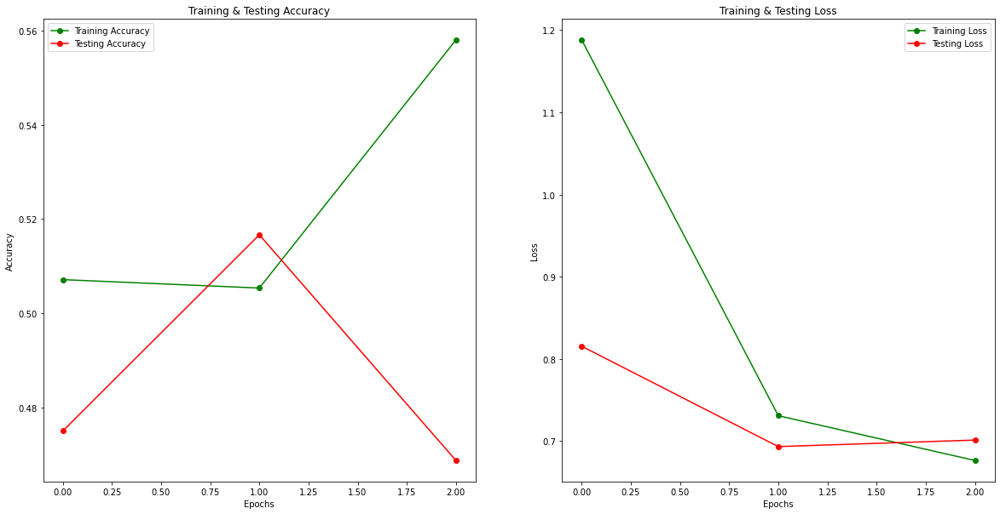

In [78]:
# Plotting for traiing and test accuracy per loop

epochs = [i for i in range(3)]
fig , ax = plt.subplots(1,2)
train_acc = result1.history['acc']
train_loss = result1.history['loss']
val_acc = result1.history['val_acc']
val_loss = result1.history['val_loss']
fig.set_size_inches(20,10)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Testing Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'go-' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'ro-' , label = 'Testing Loss')
ax[1].set_title('Training & Testing Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

In [79]:
pred = model.predict_classes(x_test)

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).


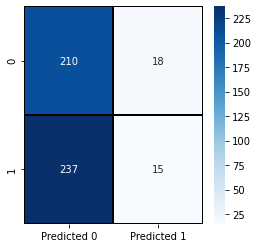

In [80]:
# Pretty CM
cm = confusion_matrix(y_test,pred)
cm = pd.DataFrame(cm , index = ['0','1'] , columns = ['0','1'])
plt.figure(figsize = (4,4))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black' , 
            linewidth = 1 , 
            annot = True, fmt='' , 
            xticklabels = ['Predicted 0','Predicted 1'] , 
            yticklabels = ['0','1'])

### Predicting on Unlabeled Data

In [117]:
# setting x and y for the model again, starting from the scratch for modeling

x= df.reviews
y= df.isFraud
x_unlabeled = df_unlabel.reviews 

In [118]:
# Checking shapes

print(x.shape)
print(x_unlabeled.shape)
print(y.shape)

(1600,)
(1600,)
(1600,)


In [119]:
# CV transfrom for both labeled and unlabeled

x = cv.fit_transform(x)
x_unlabeled = cv.transform(x_unlabeled)

In [120]:
# 8:2 ratio train test split

x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0,test_size=0.2)
x_train_un,x_test_un =train_test_split(x_unlabeled, random_state=0,test_size=0.2)

In [121]:
# Checking overall shape including dimension after vectorization

print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)
print(x_train_un.shape)
print(x_test_un.shape)


(1280, 79264)
(320, 79264)
(1280,)
(320,)
(1280, 79264)
(320, 79264)


In [122]:
# Training labled data on Mutinomial Naive Bayse Model

nb=MultinomialNB()
nb.fit(x_train,y_train)
MNB_pred_CV = nb.predict(x_test)
MNB_pred_CV_score = accuracy_score(y_test, MNB_pred_CV)
MNB_pred_CV_score

0.859375

In [123]:
# Predicting unlabled data with trained model with labeled data

MNB_unlabeled_pred = nb.predict(x_test_un)
MNB_unlabeled_probs = nb.predict_proba(x_train_un)
MNB_unlabled_score = accuracy_score(y_test, MNB_unlabeled_pred)
prob_0 = MNB_unlabeled_probs[:,0]
prob_1 = MNB_unlabeled_probs[:,1]
print("Accuracy: %.2f%%" % (MNB_unlabled_score*100.0))

Accuracy: 51.25%


Result is not good at all with 51% accuracy

In [124]:
# CM

print(confusion_matrix(y_test, MNB_unlabeled_pred))

[[116  46]
 [110  48]]


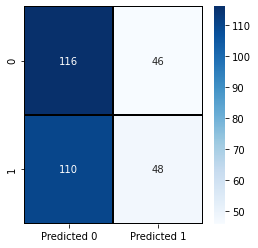

In [125]:
# Pretty CM

cm = confusion_matrix(y_test, MNB_unlabeled_pred)
cm = pd.DataFrame(cm , index = ['0','1'] , columns = ['0','1'])
plt.figure(figsize = (4,4))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black' , 
            linewidth = 1 , 
            annot = True, fmt='' , 
            xticklabels = ['Predicted 0','Predicted 1'] , 
            yticklabels = ['0','1'])

### Semi Supervised Model with Label Propagation

In [126]:
# Adding a column to label unlabled with -1 since model recognize -1 as unlabled data
df_unlabel['isFraud'] = -1

In [127]:
# Checking out
df_unlabel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1600 entries, 0 to 1599
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   reviews  1600 non-null   object
 1   isFraud  1600 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 37.5+ KB


In [128]:
frames1 = [df, df_unlabel]
combined_df = pd.concat(frames1)
combined_df

,reviews,isFraud,negative
0,completely blow away hotel magnificent get great deal happy stay arrive nervous read bad review ...,0,0.0
1,return two night stay affinia chicago visit delightful thanks tripadvisor review prepare major c...,0,0.0
2,excellent location feel like boutique hotel right next neiman marcus v expensive dept store min ...,0,0.0
3,travel lot business quite frankly expectation start reach new low usually always choose w hotel ...,0,0.0
4,visit birthday never chicago sure stay found deal hotel travelzoo great rate staff awesome helpf...,0,0.0
5,others say construction work complete suspect price hotel legitimately charge put price range pi...,0,0.0
6,check affinia hotel chicago shortly dinner tuesday greet frendly staff valet service front desk ...,0,0.0
7,large roomy clean bed room large bathroom big minibar snack assortment tuck away nicely corner h...,0,0.0
8,great hotel right heart chicago loop within walk distance downtown attraction parking expensive ...,0,0.0
9,hotel perfect girl getaway decor fun refresh love roof top bar every staff member friendly alway...,0,0.0


In [129]:
# 8:2 ratio split for train and test

X= combined_df.reviews
Y= combined_df.isFraud

x= df.reviews
y= df.isFraud


x_train, x_test, y_train, y_test =train_test_split(x,y,random_state=0,test_size=0.2)
x_train_c, x_test_c , y_train_c ,y_test_c =train_test_split(X,Y,random_state=0,test_size=0.2)

In [130]:
# CV transform for each

x_train = cv.fit_transform(x_train) 
x_test = cv.transform(x_test) 
x_train_c =cv.transform(x_train_c)
x_test_c = cv.transform(x_test_c)

In [131]:
# Chaning them into dense form because model requires it

x_train_c = x_train_c.toarray()
x_test_c = x_test_c.toarray()
x_train = x_train.toarray()
x_test = x_test.toarray()

In [132]:
# Checking the shape

print(x_train_c.shape)
print(x_test_c.shape)
print(x_train.shape)
print(x_test.shape)

(2560, 66745)
(640, 66745)
(1280, 66745)
(320, 66745)


In [133]:
# Fitting the model

lp_rbf = LabelPropagation(kernel='rbf', gamma=9e-5)
lp_rbf.fit(x_train_c, y_train_c)



LabelPropagation(gamma=9e-05)

In [136]:
pred_c =lp_rbf.predict(x_test)
print("Accuracy: %.2f%%" % (accuracy_score(y_test, pred_c)*100.0))

Accuracy: 50.62%


Accuracy is not significant

In [137]:
print(classification_report(y_test, pred_c))

              precision    recall  f1-score   support

           0       0.51      1.00      0.67       162
           1       0.00      0.00      0.00       158

    accuracy                           0.51       320
   macro avg       0.25      0.50      0.34       320
weighted avg       0.26      0.51      0.34       320



In [138]:
print(confusion_matrix(y_test, pred_c))

[[162   0]
 [158   0]]


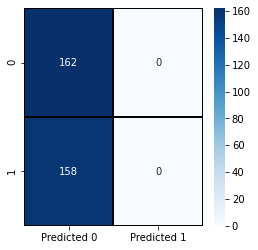

In [139]:
cm = confusion_matrix(y_test, pred_c)
cm = pd.DataFrame(cm , index = ['0','1'] , columns = ['0','1'])
plt.figure(figsize = (4,4))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black' , 
            linewidth = 1 , 
            annot = True, fmt='' , 
            xticklabels = ['Predicted 0','Predicted 1'] , 
            yticklabels = ['0','1'])

Looking at Confusion matrix, it was not able to predict TruePositives at all.

## Conclusion

- Machine learning model on labeled data was successful with highest 87.7% with supportive vector machine with TF-IDF method.
- Neural network model had accruacy of 51% accuracy.
- Both of semi-supervised model didn't perform well with also 51% accuracy.
